# **Install Roboflow**


In [1]:
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 56.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 63.5 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


# **Download Dataset from Roboflow**

In [2]:
from roboflow import Roboflow
rf = Roboflow(api_key="LkwPtZoID1t8cCSJSwQD")
project = rf.workspace("isadindrasta").project("animal-detection-2hydp")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Animal-Detection-1 in yolov8:: 100%|██████████| 2938/2938 [00:00<00:00, 5875.59it/s]


# **Rename Dataset Folder**

In [3]:
import os

old_name = 'Animal-Detection-1'
new_name = 'Animal_Detection_Datasets'

if os.path.exists(old_name) and not os.path.exists(new_name):
    os.rename(old_name, new_name)
    print("Folder renamed successfully.")
else:
    print("Rename skipped (source not found or already renamed).")


Folder renamed successfully.


## **Removing annotation file with size zero**

In [5]:
annotation_dirs = ["Animal_Detection_Datasets/train/labels"]
images_dirs = ["Animal_Detection_Datasets/train/images"]

print(f'Before: {len(os.listdir(annotation_dirs[0]))}')

for annotation_dir, images_dir in zip(annotation_dirs, images_dirs):
    annotations = os.listdir(annotation_dir)
    images = set(os.listdir(images_dir))

    for annotation in annotations:
        annotation_file = os.path.join(annotation_dir, annotation)
        image_file = annotation.replace(".txt", ".jpg")
        image_path = os.path.join(images_dir, image_file)

        # 1️⃣ Remove if image is missing
        if not os.path.exists(image_path):
            os.remove(annotation_file)
            continue

        # 2️⃣ Remove EMPTY annotation files
        if os.path.getsize(annotation_file) == 0:
            os.remove(annotation_file)
            continue

        # 3️⃣ Remove malformed annotations
        with open(annotation_file, "r") as f:
            lines = f.readlines()

        if len(lines) == 0:
            os.remove(annotation_file)
            continue

        for line in lines:
            data = line.strip().split()
            if len(data) != 5:
                os.remove(annotation_file)
                break

print(f'After: {len(os.listdir(annotation_dirs[0]))}')


Before: 1174
After: 1174


## **Importing libraries**

In [6]:
import torch
import cv2
import os

import torchvision
# Provides datasets, model architectures (like SSD, Faster R-CNN),
# and image transformation utilities for computer vision tasks.

from torch.utils.data import DataLoader
# DataLoader helps load data in batches during training or inference,
# making data processing faster and more efficient.

from torchvision.transforms import transforms
# Contains image preprocessing functions such as resize, normalize,
# tensor conversion, and data augmentation.

## **Create customdataset class**

In [7]:
# CustomDataset class is created to load images and their corresponding
# annotation files, convert them into tensors, and return them in a format
# that PyTorch object detection models can understand during training.



class CustomDataset():
    def __init__(self, image_dir, annotations, annotations_dir, transform=None):
        self.image_dir = image_dir
        self.annotations = annotations
        self.annotations_dir = annotations_dir
        self.transform = transform

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        # Get annotation file name
        annotation = self.annotations[idx]
        # Get image path
        img_path = os.path.join(self.image_dir, annotation[:-4] + '.jpg')

        # Load image
        image = cv2.imread(img_path)
        if image is None:
            raise FileNotFoundError(f"Image {img_path} not found.")

        # Convert image channels
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Get image dimensions
        height, width, _ = image.shape

        # Parse the annotation file
        annotation_file = os.path.join(self.annotations_dir, annotation)
        boxes = []
        labels = []

        # Open annotation file
        with open(annotation_file, "r") as f:
            for line in f:
                # Split data
                data = line.strip().split()
                class_index = int(data[0])  # Class index
                x_center = float(data[1]) * width
                y_center = float(data[2]) * height
                box_width = float(data[3]) * width
                box_height = float(data[4]) * height

                # Convert to absolute coordinates [xmin, ymin, xmax, ymax]
                xmin = x_center - box_width / 2
                ymin = y_center - box_height / 2
                xmax = x_center + box_width / 2
                ymax = y_center + box_height / 2

                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(int(class_index + 1))

        # Convert to PyTorch tensors
        boxes = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        # Apply transformations
        if self.transform:
            image = self.transform(image)

        # Create target dictionary
        target = {"boxes": boxes, "labels": labels}

        return image, target



## **Load Pretrained Model and Modify for Custom Classes**

In [8]:
# Total number of classes the model should predict
# 1 class is always reserved for background
# 91 are your actual object classes
num_classes = 5

# Load a Faster R-CNN model with a ResNet-50 backbone and FPN
# weights="COCO_V1" loads pretrained weights trained on the COCO dataset
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
    weights="COCO_V1"
)

print(model)

# Get the number of input features for the classification layer
# This is required when replacing the prediction head
in_features = model.roi_heads.box_predictor.cls_score.in_features

# Replace the existing classification head with a new one
# This allows the model to predict 'num_classes' instead of COCO's 91 classes
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
    in_features,  # Number of input features
    num_classes   # Number of output classes (including background)
)



Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 198MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [9]:
print(model)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

## **Creating the Dataloader**

In [10]:
# Step 4: Dataset and DataLoader

## TRAIN DATALOADER
train_image_dir = "Animal_Detection_Datasets/train/images"
train_annotation_dir = "Animal_Detection_Datasets/train/labels"
train_annotations = os.listdir(train_annotation_dir)

transform = transforms.Compose([
    transforms.ToTensor()
])

train_dataset = CustomDataset(train_image_dir, train_annotations, train_annotation_dir, transform=transform)

# Creates a DataLoader that loads training data in batches of 4,
# shuffles the data each epoch, and uses a custom collate function
# to group images and targets separately (useful when samples have
# different sizes, e.g., in object detection).
train_data_loader = DataLoader(
    train_dataset,
    batch_size=2,
    shuffle=True,
    collate_fn=lambda x: tuple(zip(*x))
)


In [11]:
print(len(train_data_loader))

587


## **Setting LR OPTIM**

In [12]:
# Step 5: Training Setup
# Select GPU (CUDA) if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move the model's parameters and buffers to the selected device (GPU/CPU)
model.to(device)

# Collect only those parameters that will be updated during training
# (i.e., parameters with requires_grad = True)
params = [p for p in model.parameters() if p.requires_grad]

# Define the optimizer
# SGD = Stochastic Gradient Descent
# lr=0.001 → learning rate (controls step size during weight updates)
# momentum=0.9 → helps speed up convergence and reduce oscillations
optimizer = torch.optim.SGD(
    params,
    lr=0.001,
    momentum=0.9
)

# Number of complete passes through the training dataset
num_epochs = 10


# **Get class_names list**

In [13]:
import yaml

def load_class_names(yaml_path):
    with open(yaml_path, "r") as f:
        data = yaml.safe_load(f)
    return data["names"]

class_names = load_class_names('Animal_Detection_Datasets/data.yaml')

print(class_names)

['buffalo', 'elephant', 'rhino', 'zebra']


## **Checking Dataloader**

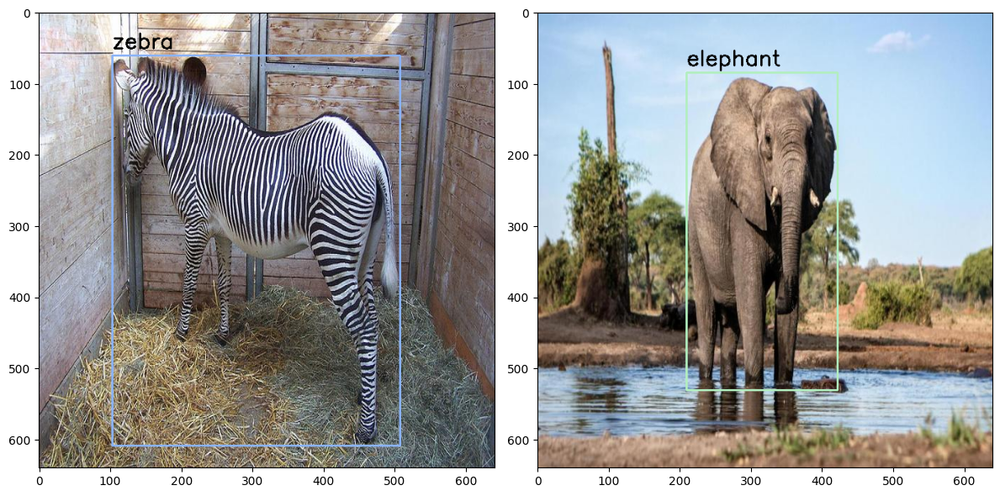

In [14]:
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt

# Get a batch of images and targets from the data loader
data_loader_iter = iter(train_data_loader)
images, targets = next(data_loader_iter)

# Create matplotlib figure
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax = ax.ravel()

# Loop through first 2 images
for idx in range(2):

    # Convert tensor image (C, H, W) → (H, W, C)
    image = images[idx].permute(1, 2, 0).cpu().numpy()

    # Convert float [0,1] → uint8 [0,255]
    image = (image * 255).astype(np.uint8).copy()

    target = targets[idx]
    boxes = target["boxes"].cpu().numpy()
    labels = target["labels"].cpu().numpy()

    # Draw bounding boxes and labels USING OPENCV
    for box, label in zip(boxes, labels):

        color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

        xmin, ymin, xmax, ymax = box.astype(int)

        # Draw bounding box
        cv2.rectangle(
            image,
            (xmin, ymin),
            (xmax, ymax),
            color,
            2
        )

        # Draw label text
        cv2.putText(
            image,
            class_names[label - 1],  # label-1 because 0 = background
            (xmin, max(ymin - 10, 20)),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            (0, 0, 0),
            2
        )

    # Show using matplotlib
    ax[idx].imshow(image)
    # ax[idx].axis("off")

plt.tight_layout()
plt.show()


In [15]:
from tqdm import tqdm

train_loss = []

for epoch in range(num_epochs):

    print(f"\nStarting the training of Epoch_{epoch+1}.....")
    model.train()

    train_running_loss = 0.0

    pbar = tqdm(
        train_data_loader,
        total=len(train_data_loader),
        desc=f"Epoch [{epoch+1}/{num_epochs}] Training",
        leave=True
    )

    for images, targets in pbar:
        # Move data to device
        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(images, targets)

        # Total loss (sum of all components)
        losses = sum(loss for loss in loss_dict.values())

        # Weight update formula:
        # new_weight = old_weight - learning_rate * gradient

        # Gradient: tells how much and in which direction a weight should change
        # to reduce the loss

        optimizer.zero_grad()   # Clear previously stored gradients
        losses.backward()       # Compute gradients for all weights
        optimizer.step()        # Update weights using: weight = weight - lr * gradient


        # Accumulate batch loss
        batch_loss = losses.item()
        train_running_loss += batch_loss


    # Correct epoch loss (average over batches)
    epoch_loss = train_running_loss / len(train_data_loader)
    train_loss.append(epoch_loss)

    print(f"Train_Loss: {epoch_loss:.4f}")



Starting the training of Epoch_1.....


Epoch [1/10] Training: 100%|██████████| 587/587 [03:56<00:00,  2.48it/s]


Train_Loss: 0.2333

Starting the training of Epoch_2.....


Epoch [2/10] Training: 100%|██████████| 587/587 [04:05<00:00,  2.39it/s]


Train_Loss: 0.1266

Starting the training of Epoch_3.....


Epoch [3/10] Training: 100%|██████████| 587/587 [04:06<00:00,  2.38it/s]


Train_Loss: 0.1004

Starting the training of Epoch_4.....


Epoch [4/10] Training: 100%|██████████| 587/587 [04:06<00:00,  2.38it/s]


Train_Loss: 0.0874

Starting the training of Epoch_5.....


Epoch [5/10] Training: 100%|██████████| 587/587 [04:06<00:00,  2.39it/s]


Train_Loss: 0.0769

Starting the training of Epoch_6.....


Epoch [6/10] Training: 100%|██████████| 587/587 [04:06<00:00,  2.38it/s]


Train_Loss: 0.0686

Starting the training of Epoch_7.....


Epoch [7/10] Training: 100%|██████████| 587/587 [04:06<00:00,  2.39it/s]


Train_Loss: 0.0630

Starting the training of Epoch_8.....


Epoch [8/10] Training: 100%|██████████| 587/587 [04:06<00:00,  2.38it/s]


Train_Loss: 0.0588

Starting the training of Epoch_9.....


Epoch [9/10] Training: 100%|██████████| 587/587 [04:06<00:00,  2.38it/s]


Train_Loss: 0.0545

Starting the training of Epoch_10.....


Epoch [10/10] Training: 100%|██████████| 587/587 [04:06<00:00,  2.38it/s]

Train_Loss: 0.0516


# **Plot the graph**

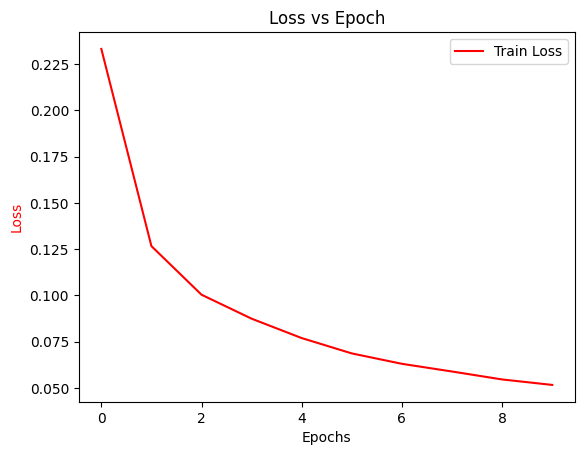

In [16]:
epoch_log = [*range(num_epochs)]

fig,ax1 = plt.subplots()
ax1.plot(epoch_log,train_loss,'r-',label = 'Train Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss',color='r')
ax1.set_title('Loss vs Epoch')
ax1.legend()
plt.show()

# **Save the model**

In [17]:
path = 'model.pth'
torch.save(model.state_dict(), path)

# **Plot the images**


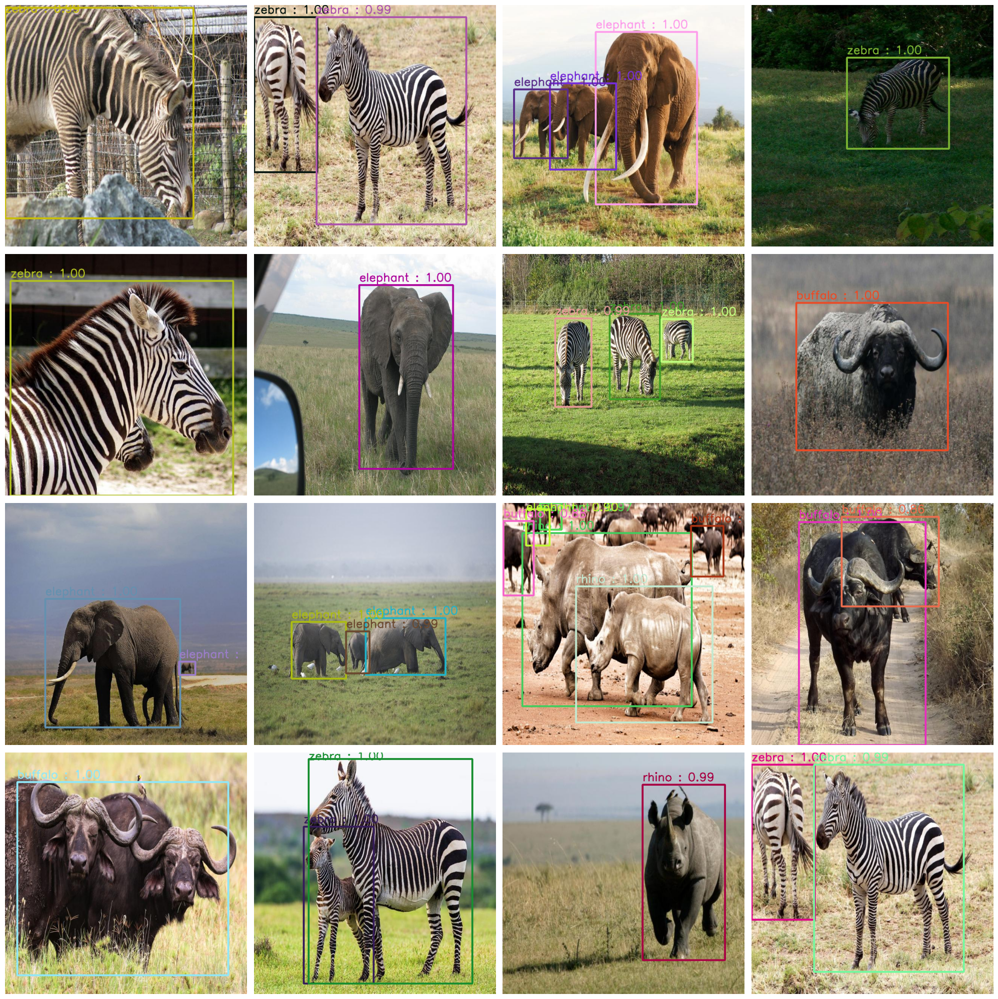

In [23]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import random
import os
import torch
import torchvision
from torchvision.transforms import transforms
import cv2

# -------------------------------
# Model Setup
# -------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

num_classes = 5
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Replace classification head
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
    in_features, num_classes
)

# Load trained weights
model.load_state_dict(torch.load("/content/animal_fasterrcnn.pth", map_location="cpu"))
model.to(device)
model.eval()

# -------------------------------
# Transform
# -------------------------------
transform = transforms.Compose([
    transforms.ToTensor()
])

# -------------------------------
# Test images
# -------------------------------
test_dir = "Animal_Detection_Datasets/test/images"
test_list_file = os.listdir(test_dir)

# -------------------------------
# Inference + Visualization
# -------------------------------
fig, ax = plt.subplots(4, 4, figsize=(20, 20))
ax = ax.ravel()

for idx in range(16):

    # Load random image
    img_path = os.path.join(test_dir, random.choice(test_list_file))
    pil_image = Image.open(img_path).convert("RGB")

    image = transform(pil_image)
    image_tensor = image.unsqueeze(0).to(device)

    # Prediction
    with torch.no_grad():
        prediction = model(image_tensor)[0]

    # Convert tensor → numpy → uint8
    image_np = image.permute(1, 2, 0).cpu().numpy()
    image_np = (image_np * 255).astype(np.uint8).copy()

    boxes = prediction["boxes"].cpu().numpy()
    labels = prediction["labels"].cpu().numpy()
    scores = prediction["scores"].cpu().numpy()

    # -------------------------------
    # Draw using OpenCV
    # -------------------------------
    for box, label, score in zip(boxes, labels, scores):

        if score >= 0.8:  # set threshold if needed
            xmin, ymin, xmax, ymax = box.astype(int)

            # Random color (RGB)
            color = (
                random.randint(0, 255),
                random.randint(0, 255),
                random.randint(0, 255)
            )

            # Draw bounding box
            cv2.rectangle(
                image_np,
                (xmin, ymin),
                (xmax, ymax),
                color,
                3
            )

            # Draw label text
            cv2.putText(
                image_np,
                f"{class_names[label - 1]} : {score:.2f}",
                (xmin, max(ymin - 10, 20)),
                cv2.FONT_HERSHEY_SIMPLEX,
                1,
                color,
                2
            )

    # -------------------------------
    # Show using Matplotlib
    # -------------------------------
    ax[idx].imshow(image_np)
    ax[idx].axis("off")

plt.tight_layout()
plt.show()
